# BBM418 Assignment 3

## Dataset Preparation

The original dataset contains three folders:
- `Images`: All parking lot images captured by drones.
- `Annotations`: Ground-truth bounding boxes for each image, in text format.
- `ImageSets`: Lists of image IDs for training, validation, and testing.

In this step, the annotations were converted into YOLO format and organized under a new structure required by the YOLOv8 training pipeline.

Each annotation was converted using the formula:
- **Class ID**: Always `0` (only cars are detected)
- **Bounding box format**: `(center_x, center_y, width, height)` — all normalized to [0,1]

The following steps were applied:
1. Read each image and its corresponding annotation using the image IDs in `train.txt`, `val.txt`, and `test.txt`.
2. For each bounding box, calculate:
   - Center `(cx, cy)` from corner coordinates.
   - Width and height from the box size.
3. Save the converted annotations under the `labels/` directory, and copy the images to `images/`.

> This ensures that YOLOv8 can properly train and evaluate using the dataset in the correct format.


In [2]:
import os
import shutil
from PIL import Image

BASE_DIR = "cars_dataset"
IMAGE_DIR = os.path.join(BASE_DIR, "Images")
ANNOTATION_DIR = os.path.join(BASE_DIR, "Annotations")
IMAGESETS_DIR = os.path.join(BASE_DIR, "ImageSets")
OUTPUT_DIR = "dataset"

for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(OUTPUT_DIR, "images", split), exist_ok=True)
    os.makedirs(os.path.join(OUTPUT_DIR, "labels", split), exist_ok=True)

def convert_to_yolo_format(image_path, annot_path):
    img = Image.open(image_path)
    w, h = img.size
    lines = []
    with open(annot_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 4:
                continue
            x1, y1, x2, y2 = map(int, parts[:4])
            cx = ((x1 + x2) / 2) / w
            cy = ((y1 + y2) / 2) / h
            bw = (x2 - x1) / w
            bh = (y2 - y1) / h
            lines.append(f"0 {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}")
    return lines

def process_split(split):
    with open(os.path.join(IMAGESETS_DIR, f"{split}.txt")) as f:
        image_ids = [line.strip() for line in f]
    
    for img_id in image_ids:
        img_path = os.path.join(IMAGE_DIR, f"{img_id}.png")
        annot_path = os.path.join(ANNOTATION_DIR, f"{img_id}.txt")
        if not os.path.exists(img_path) or not os.path.exists(annot_path):
            continue

        out_img_path = os.path.join(OUTPUT_DIR, "images", split, f"{img_id}.png")
        out_lbl_path = os.path.join(OUTPUT_DIR, "labels", split, f"{img_id}.txt")

        shutil.copy(img_path, out_img_path)
        yolo_lines = convert_to_yolo_format(img_path, annot_path)
        with open(out_lbl_path, "w") as out_f:
            out_f.write("\n".join(yolo_lines))

for split in ["train", "val", "test"]:
    process_split(split)

print("The dataset has been converted to YOLO format")

The dataset has been converted to YOLO format


## Model Training: Freeze Experiments

To understand how freezing different portions of the YOLOv8n model affects performance, we trained the model under four different settings. All models were trained for 50 epochs using a resolution of 640×640 and a batch size of 16. The dataset configuration was provided via `dataset.yaml`.

The `freeze` parameter controls how many of the initial layers are frozen (i.e., not updated during training). The following configurations were used:

| Model Name     | Freeze Value | Description                                                                 |
|----------------|--------------|-----------------------------------------------------------------------------|
| `car_freeze5`  | 5            | Freezes the stem + first two C2f backbone blocks                           |
| `car_freeze10` | 10           | Freezes the full backbone and the SPPF (Spatial Pyramid Pooling - Fast)    |
| `car_freeze21` | 21           | Freezes all layers except the detection head                               |
| `car_full`     | 0            | No freezing; the full network is trained end-to-end                        |

Each model was trained with the following command pattern:

```python
model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    freeze=<value>,
    name=<model_name>,
    project="runs/detect"
)


In [2]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    freeze=5,
    name="car_freeze5",
    project="runs/detect"
)

New https://pypi.org/project/ultralytics/8.3.141 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=5, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_freeze5, nbs=64, nms=False, opset=None, opti

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:02<00:00, 471.37it/s]


train: New cache created: C:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache
val: Fast image access  (ping: 0.10.0 ms, read: 180.245.9 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 420.88it/s]


val: New cache created: C:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache
Plotting labels to runs\detect\car_freeze5\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\car_freeze5
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.44G       1.44      1.763      1.001       1118        640: 100%|██████████| 63/63 [00:09<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]

                   all        200      11906      0.937      0.938      0.958      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.15G      1.182     0.7426     0.9177        787        640: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.58it/s]

                   all        200      11906      0.967      0.945      0.977      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.03G      1.106     0.6604     0.9011        870        640: 100%|██████████| 63/63 [00:07<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]

                   all        200      11906      0.985      0.961      0.988       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.38G      1.054     0.6165     0.8923        669        640: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.22it/s]

                   all        200      11906      0.989      0.961       0.99      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.89G      1.031     0.5927      0.881        908        640: 100%|██████████| 63/63 [00:07<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.12it/s]

                   all        200      11906      0.989       0.97      0.992       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.38G     0.9964     0.5714     0.8779        585        640: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.22it/s]

                   all        200      11906      0.991      0.968      0.992      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.92G     0.9812     0.5473     0.8723        922        640: 100%|██████████| 63/63 [00:07<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.00it/s]

                   all        200      11906      0.989      0.976      0.993      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.92G     0.9564     0.5378     0.8674        766        640: 100%|██████████| 63/63 [00:06<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.95it/s]

                   all        200      11906       0.99      0.972      0.992      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.92G     0.9673     0.5309     0.8703        900        640: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]

                   all        200      11906      0.989      0.978      0.993      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.92G     0.9381     0.5142     0.8643       1024        640: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]

                   all        200      11906       0.99      0.976      0.993      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.92G     0.9352      0.504     0.8639        902        640: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906      0.986      0.974      0.992      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.81G     0.9151     0.4933     0.8604        736        640: 100%|██████████| 63/63 [00:07<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.01it/s]

                   all        200      11906      0.991      0.979      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.97G     0.9216     0.4922     0.8596       1119        640: 100%|██████████| 63/63 [00:07<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.01it/s]

                   all        200      11906      0.989      0.979      0.993      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.63G     0.9086     0.4836     0.8553        931        640: 100%|██████████| 63/63 [00:07<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.06it/s]

                   all        200      11906      0.991      0.976      0.993       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.77G     0.9034     0.4797     0.8563        983        640: 100%|██████████| 63/63 [00:06<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.98it/s]

                   all        200      11906       0.99      0.978      0.994      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.34G     0.8914     0.4733      0.852       1080        640: 100%|██████████| 63/63 [00:07<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.03it/s]

                   all        200      11906      0.991      0.979      0.994      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.22G     0.8821     0.4656     0.8513        827        640: 100%|██████████| 63/63 [00:07<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.21it/s]

                   all        200      11906      0.992      0.979      0.994      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.99G     0.8827     0.4644     0.8517        843        640: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  7.00it/s]

                   all        200      11906       0.99       0.98      0.993      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.59G     0.8842     0.4611      0.851        718        640: 100%|██████████| 63/63 [00:07<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.94it/s]

                   all        200      11906      0.991      0.978      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.59G     0.8631     0.4534     0.8507        772        640: 100%|██████████| 63/63 [00:07<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]

                   all        200      11906      0.992       0.98      0.994      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.59G     0.8541     0.4467     0.8465        949        640: 100%|██████████| 63/63 [00:07<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]

                   all        200      11906      0.992      0.981      0.994      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.59G     0.8667     0.4499     0.8477       1063        640: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.05it/s]

                   all        200      11906       0.99       0.98      0.994      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.59G     0.8523     0.4423     0.8471       1217        640: 100%|██████████| 63/63 [00:07<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.91it/s]

                   all        200      11906      0.992       0.98      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.59G     0.8512     0.4406     0.8457        502        640: 100%|██████████| 63/63 [00:07<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]

                   all        200      11906      0.992      0.981      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.59G     0.8437     0.4375     0.8428        857        640: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]

                   all        200      11906      0.991      0.983      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.59G      0.846     0.4381     0.8445        986        640: 100%|██████████| 63/63 [00:07<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.91it/s]

                   all        200      11906      0.991      0.983      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.59G     0.8368      0.434     0.8462        908        640: 100%|██████████| 63/63 [00:07<00:00,  8.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.77it/s]

                   all        200      11906      0.993      0.982      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.59G     0.8459     0.4342     0.8448        914        640: 100%|██████████| 63/63 [00:07<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]

                   all        200      11906      0.992      0.983      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.59G     0.8268     0.4241     0.8422        730        640: 100%|██████████| 63/63 [00:07<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.44it/s]

                   all        200      11906      0.993      0.981      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.59G     0.8327     0.4272     0.8419        709        640: 100%|██████████| 63/63 [00:07<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.80it/s]

                   all        200      11906      0.993      0.983      0.994      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.89G      0.832     0.4259     0.8395       1028        640: 100%|██████████| 63/63 [00:07<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.77it/s]

                   all        200      11906      0.993      0.983      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.59G      0.818     0.4165     0.8414        797        640: 100%|██████████| 63/63 [00:07<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.85it/s]

                   all        200      11906      0.992      0.983      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.28G     0.8188     0.4178     0.8396        935        640: 100%|██████████| 63/63 [00:07<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]

                   all        200      11906      0.991      0.985      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.68G     0.8096     0.4142     0.8382       1109        640: 100%|██████████| 63/63 [00:07<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.95it/s]

                   all        200      11906      0.991      0.984      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.88G     0.8154     0.4134     0.8388        949        640: 100%|██████████| 63/63 [00:07<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.07it/s]

                   all        200      11906      0.993      0.982      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.66G     0.8081     0.4106      0.835        800        640: 100%|██████████| 63/63 [00:07<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.82it/s]

                   all        200      11906      0.992      0.984      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.66G     0.7997     0.4078     0.8374        895        640: 100%|██████████| 63/63 [00:07<00:00,  8.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.10it/s]

                   all        200      11906      0.993      0.982      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.88G     0.7997     0.4053     0.8363        863        640: 100%|██████████| 63/63 [00:07<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.76it/s]

                   all        200      11906      0.993      0.983      0.994      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.16G     0.8043     0.4057     0.8349       1134        640: 100%|██████████| 63/63 [00:07<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.95it/s]

                   all        200      11906      0.993      0.982      0.994      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.09G     0.7945     0.4033     0.8355        719        640: 100%|██████████| 63/63 [00:07<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.34it/s]

                   all        200      11906      0.992      0.985      0.994      0.825


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.01G     0.7493     0.3888     0.8319        667        640: 100%|██████████| 63/63 [00:06<00:00,  9.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.96it/s]

                   all        200      11906      0.993      0.983      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.41G     0.7423     0.3789       0.83        629        640: 100%|██████████| 63/63 [00:05<00:00, 10.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.92it/s]

                   all        200      11906      0.992      0.983      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.41G     0.7411     0.3764     0.8295        500        640: 100%|██████████| 63/63 [00:05<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.94it/s]

                   all        200      11906      0.992      0.985      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.41G     0.7385     0.3738     0.8291        441        640: 100%|██████████| 63/63 [00:05<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.90it/s]

                   all        200      11906      0.991      0.985      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.41G     0.7336     0.3709     0.8296        447        640: 100%|██████████| 63/63 [00:05<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.46it/s]

                   all        200      11906      0.992      0.983      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.41G      0.726      0.367     0.8268        444        640: 100%|██████████| 63/63 [00:05<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.99it/s]

                   all        200      11906      0.991      0.986      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.41G     0.7184     0.3623     0.8275        431        640: 100%|██████████| 63/63 [00:05<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]

                   all        200      11906      0.991      0.986      0.994       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.41G      0.715     0.3604     0.8259        712        640: 100%|██████████| 63/63 [00:05<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.79it/s]

                   all        200      11906      0.991      0.985      0.994      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.41G     0.7145     0.3592      0.826        601        640: 100%|██████████| 63/63 [00:05<00:00, 10.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.13it/s]

                   all        200      11906      0.992      0.985      0.994      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.41G     0.7121      0.357     0.8242        611        640: 100%|██████████| 63/63 [00:05<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.89it/s]

                   all        200      11906      0.991      0.985      0.994      0.833



50 epochs completed in 0.119 hours.
Optimizer stripped from runs\detect\car_freeze5\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\car_freeze5\weights\best.pt, 6.2MB

Validating runs\detect\car_freeze5\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]


                   all        200      11906      0.991      0.986      0.994      0.833
Speed: 0.3ms preprocess, 1.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs\detect\car_freeze5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000246C1D55C00>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [3]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    freeze=10,
    name="car_freeze10",
    project="runs/detect"
)

New https://pypi.org/project/ultralytics/8.3.141 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_freeze10, nbs=64, nms=False, opset=None, op

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.0 ms, read: 1016.7379.8 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\detect\car_freeze10\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\car_freeze10
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.26G      1.466      1.813      1.012       1118        640: 100%|██████████| 63/63 [00:07<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]

                   all        200      11906      0.919      0.927      0.956      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.93G      1.201     0.7657     0.9226        787        640: 100%|██████████| 63/63 [00:06<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]

                   all        200      11906      0.966      0.935      0.977      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       3.8G      1.136     0.6825     0.9079        870        640: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.92it/s]

                   all        200      11906      0.978      0.954       0.98      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.81G      1.079     0.6341     0.8976        669        640: 100%|██████████| 63/63 [00:06<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.72it/s]

                   all        200      11906      0.982      0.958      0.987      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.81G      1.058     0.6063     0.8862        908        640: 100%|██████████| 63/63 [00:06<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.74it/s]

                   all        200      11906      0.983      0.965      0.989      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.76G      1.027     0.5896      0.885        585        640: 100%|██████████| 63/63 [00:06<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]

                   all        200      11906      0.988      0.963      0.991      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       3.7G      1.008     0.5661     0.8778        922        640: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.60it/s]

                   all        200      11906      0.986      0.967      0.992      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       3.7G      1.003     0.5613     0.8764        766        640: 100%|██████████| 63/63 [00:06<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]

                   all        200      11906      0.987      0.971      0.992      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50       3.7G     0.9959     0.5477     0.8761        900        640: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]

                   all        200      11906      0.986      0.973      0.992      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       3.7G     0.9776     0.5417     0.8714       1024        640: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]

                   all        200      11906      0.986      0.973      0.992       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       3.7G     0.9559     0.5224     0.8677        902        640: 100%|██████████| 63/63 [00:06<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.10it/s]

                   all        200      11906       0.99      0.973      0.992      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.59G     0.9392     0.5107     0.8644        736        640: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]

                   all        200      11906      0.987      0.971      0.993      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.74G     0.9525     0.5169     0.8659       1119        640: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]

                   all        200      11906      0.988      0.973      0.992      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.41G     0.9422     0.5065     0.8614        931        640: 100%|██████████| 63/63 [00:06<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]

                   all        200      11906      0.992      0.975      0.993      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.55G     0.9344      0.498     0.8616        983        640: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]

                   all        200      11906      0.989      0.977      0.993      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.14G     0.9259     0.4909     0.8576       1080        640: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]

                   all        200      11906       0.99      0.977      0.993       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50         6G     0.9167     0.4851     0.8573        827        640: 100%|██████████| 63/63 [00:07<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.81it/s]

                   all        200      11906      0.989      0.977      0.993      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.77G     0.9174     0.4834     0.8572        843        640: 100%|██████████| 63/63 [00:07<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.59it/s]

                   all        200      11906      0.989      0.978      0.993      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.37G      0.913     0.4826      0.856        718        640: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]

                   all        200      11906       0.99      0.977      0.993      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.37G     0.9043     0.4776     0.8574        772        640: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.76it/s]

                   all        200      11906      0.991      0.977      0.993      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.37G     0.8964     0.4709     0.8532        949        640: 100%|██████████| 63/63 [00:06<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]

                   all        200      11906       0.99       0.98      0.993      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.37G     0.8924     0.4669     0.8527       1063        640: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.72it/s]

                   all        200      11906       0.99      0.976      0.993      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.37G     0.8951     0.4662     0.8535       1217        640: 100%|██████████| 63/63 [00:06<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.80it/s]

                   all        200      11906       0.99       0.98      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.37G     0.8839      0.465      0.852        502        640: 100%|██████████| 63/63 [00:06<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]

                   all        200      11906      0.991      0.978      0.994      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.37G     0.8842     0.4646     0.8499        857        640: 100%|██████████| 63/63 [00:07<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.50it/s]

                   all        200      11906      0.992      0.979      0.994      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.37G     0.8946      0.468     0.8523        986        640: 100%|██████████| 63/63 [00:06<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.82it/s]

                   all        200      11906      0.988      0.982      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.37G     0.8761     0.4554     0.8528        908        640: 100%|██████████| 63/63 [00:06<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.18it/s]

                   all        200      11906      0.992       0.98      0.994      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.37G     0.8804     0.4551     0.8499        914        640: 100%|██████████| 63/63 [00:06<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.33it/s]

                   all        200      11906      0.991       0.98      0.994      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.37G      0.869     0.4488     0.8488        730        640: 100%|██████████| 63/63 [00:06<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.98it/s]

                   all        200      11906       0.99      0.981      0.993      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.37G     0.8709       0.45     0.8479        709        640: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.89it/s]

                   all        200      11906      0.989      0.982      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.67G     0.8733     0.4491     0.8465       1028        640: 100%|██████████| 63/63 [00:07<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.04it/s]

                   all        200      11906      0.991      0.979      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.39G     0.8605     0.4409     0.8482        797        640: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.03it/s]

                   all        200      11906      0.991       0.98      0.994      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.05G     0.8632      0.444      0.847        935        640: 100%|██████████| 63/63 [00:06<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.40it/s]

                   all        200      11906      0.992       0.98      0.994      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.47G     0.8578     0.4417     0.8457       1109        640: 100%|██████████| 63/63 [00:06<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]

                   all        200      11906      0.992       0.98      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.66G     0.8644     0.4413     0.8467        949        640: 100%|██████████| 63/63 [00:06<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]

                   all        200      11906       0.99      0.983      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.46G     0.8565     0.4379     0.8425        800        640: 100%|██████████| 63/63 [00:06<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.71it/s]

                   all        200      11906       0.99      0.982      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.44G     0.8448     0.4335     0.8449        895        640: 100%|██████████| 63/63 [00:06<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]

                   all        200      11906      0.991      0.982      0.994      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.66G     0.8502     0.4344     0.8444        863        640: 100%|██████████| 63/63 [00:06<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]

                   all        200      11906      0.992      0.982      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.94G     0.8577     0.4338      0.843       1134        640: 100%|██████████| 63/63 [00:06<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.83it/s]

                   all        200      11906      0.992      0.981      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.94G     0.8422     0.4299     0.8432        719        640: 100%|██████████| 63/63 [00:06<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]

                   all        200      11906      0.992      0.982      0.994       0.81


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.94G       0.79     0.4122     0.8384        667        640: 100%|██████████| 63/63 [00:05<00:00, 10.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]

                   all        200      11906      0.991      0.983      0.994      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.94G     0.7805     0.4025      0.836        629        640: 100%|██████████| 63/63 [00:05<00:00, 11.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.53it/s]

                   all        200      11906      0.992      0.984      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.94G      0.782     0.4002     0.8361        500        640: 100%|██████████| 63/63 [00:05<00:00, 11.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.59it/s]

                   all        200      11906      0.992      0.984      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.94G     0.7812      0.398     0.8357        441        640: 100%|██████████| 63/63 [00:05<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.06it/s]

                   all        200      11906      0.991      0.984      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.94G     0.7754     0.3939     0.8364        447        640: 100%|██████████| 63/63 [00:05<00:00, 12.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]

                   all        200      11906      0.992      0.982      0.994      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.94G      0.768     0.3907     0.8334        444        640: 100%|██████████| 63/63 [00:05<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.05it/s]

                   all        200      11906      0.993      0.982      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.94G     0.7618     0.3876     0.8342        431        640: 100%|██████████| 63/63 [00:05<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.44it/s]

                   all        200      11906      0.992      0.983      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.94G     0.7606     0.3863     0.8331        712        640: 100%|██████████| 63/63 [00:05<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.17it/s]

                   all        200      11906      0.992      0.983      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.94G     0.7602     0.3855     0.8331        601        640: 100%|██████████| 63/63 [00:05<00:00, 11.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]

                   all        200      11906      0.992      0.983      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.94G     0.7598     0.3837     0.8316        611        640: 100%|██████████| 63/63 [00:05<00:00, 11.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]

                   all        200      11906      0.992      0.983      0.994      0.819



50 epochs completed in 0.113 hours.
Optimizer stripped from runs\detect\car_freeze10\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\car_freeze10\weights\best.pt, 6.2MB

Validating runs\detect\car_freeze10\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.19it/s]


                   all        200      11906      0.992      0.983      0.994      0.819
Speed: 0.3ms preprocess, 0.9ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs\detect\car_freeze10


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002469C28A410>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [4]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    freeze=21,
    name="car_freeze21",
    project="runs/detect"
)

New https://pypi.org/project/ultralytics/8.3.141 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=21, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_freeze21, nbs=64, nms=False, opset=None, op

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.00.0 ms, read: 1568.1536.1 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\detect\car_freeze21\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\car_freeze21
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.86G       1.57      2.093      1.084       1118        640: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]

                   all        200      11906      0.809       0.83       0.88      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.53G      1.391      1.008       1.01        787        640: 100%|██████████| 63/63 [00:06<00:00, 10.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]

                   all        200      11906      0.871      0.872      0.923      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.48G      1.334     0.8959     0.9967        870        640: 100%|██████████| 63/63 [00:06<00:00, 10.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.96it/s]

                   all        200      11906      0.894      0.879      0.936      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.48G      1.282     0.8229     0.9864        669        640: 100%|██████████| 63/63 [00:06<00:00, 10.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.81it/s]

                   all        200      11906      0.935      0.894      0.954      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.48G       1.26     0.7857     0.9705        908        640: 100%|██████████| 63/63 [00:06<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  7.00it/s]

                   all        200      11906       0.95       0.92      0.963      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.44G      1.239      0.771     0.9715        585        640: 100%|██████████| 63/63 [00:06<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.95it/s]

                   all        200      11906      0.958      0.918      0.968      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.38G      1.222     0.7445     0.9619        922        640: 100%|██████████| 63/63 [00:06<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.13it/s]

                   all        200      11906      0.954      0.925      0.967      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.38G      1.219     0.7417     0.9613        766        640: 100%|██████████| 63/63 [00:06<00:00, 10.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.78it/s]

                   all        200      11906      0.952       0.92      0.967      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.38G        1.2     0.7253     0.9569        900        640: 100%|██████████| 63/63 [00:06<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906       0.96      0.925      0.971      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.38G      1.196     0.7213     0.9542       1024        640: 100%|██████████| 63/63 [00:06<00:00, 10.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.93it/s]

                   all        200      11906      0.946      0.931       0.97      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.38G      1.184     0.7071     0.9529        902        640: 100%|██████████| 63/63 [00:06<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.00it/s]

                   all        200      11906      0.955      0.929      0.971      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.27G      1.181     0.7048     0.9511        736        640: 100%|██████████| 63/63 [00:06<00:00, 10.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.91it/s]

                   all        200      11906      0.966       0.93      0.974      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.42G      1.188     0.7033     0.9504       1119        640: 100%|██████████| 63/63 [00:06<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.14it/s]

                   all        200      11906      0.964      0.926      0.974      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.09G      1.181     0.6939     0.9459        931        640: 100%|██████████| 63/63 [00:06<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906      0.966      0.927      0.974      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.22G      1.174     0.6924     0.9472        983        640: 100%|██████████| 63/63 [00:06<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.00it/s]

                   all        200      11906      0.961      0.928      0.974      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.79G      1.173     0.6897     0.9417       1080        640: 100%|██████████| 63/63 [00:06<00:00, 10.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.13it/s]

                   all        200      11906      0.959      0.933      0.973      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.31G      1.163     0.6806     0.9416        827        640: 100%|██████████| 63/63 [00:06<00:00, 10.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]

                   all        200      11906      0.967      0.935      0.976      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.42G      1.166     0.6798     0.9423        843        640: 100%|██████████| 63/63 [00:06<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.23it/s]

                   all        200      11906       0.96      0.933      0.975      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.02G      1.151     0.6712     0.9383        718        640: 100%|██████████| 63/63 [00:06<00:00, 10.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]

                   all        200      11906      0.965      0.934      0.978      0.704

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50      3.02G      1.144     0.6749     0.9435        772        640: 100%|██████████| 63/63 [00:06<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.47it/s]

                   all        200      11906      0.968      0.937      0.979      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.02G      1.136     0.6596     0.9353        949        640: 100%|██████████| 63/63 [00:06<00:00, 10.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.11it/s]

                   all        200      11906      0.972      0.935      0.979      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.02G      1.139     0.6637     0.9368       1063        640: 100%|██████████| 63/63 [00:06<00:00, 10.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]

                   all        200      11906      0.968      0.931      0.978      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.02G      1.137     0.6588     0.9365       1217        640: 100%|██████████| 63/63 [00:06<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]

                   all        200      11906      0.966      0.941      0.979      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.02G      1.145     0.6602     0.9376        502        640: 100%|██████████| 63/63 [00:06<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.37it/s]

                   all        200      11906      0.968      0.939       0.98      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.02G      1.141     0.6551     0.9336        857        640: 100%|██████████| 63/63 [00:06<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906      0.971      0.941      0.981      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.02G      1.154     0.6625     0.9392        986        640: 100%|██████████| 63/63 [00:06<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]

                   all        200      11906      0.967      0.937       0.98      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.02G      1.131     0.6533     0.9408        908        640: 100%|██████████| 63/63 [00:06<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.96it/s]

                   all        200      11906       0.97      0.941       0.98      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.02G      1.135     0.6569     0.9343        914        640: 100%|██████████| 63/63 [00:06<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.33it/s]

                   all        200      11906      0.969      0.942      0.981      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.02G      1.129     0.6479     0.9344        730        640: 100%|██████████| 63/63 [00:06<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.60it/s]

                   all        200      11906      0.969      0.943      0.982      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.02G      1.134     0.6493     0.9337        709        640: 100%|██████████| 63/63 [00:06<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.41it/s]

                   all        200      11906      0.968       0.94      0.981      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.32G       1.14     0.6475      0.931       1028        640: 100%|██████████| 63/63 [00:06<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.50it/s]

                   all        200      11906      0.968      0.939       0.98      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.04G       1.12     0.6407     0.9343        797        640: 100%|██████████| 63/63 [00:06<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.23it/s]

                   all        200      11906      0.971      0.942      0.981      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.71G      1.129      0.646     0.9331        935        640: 100%|██████████| 63/63 [00:06<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.34it/s]

                   all        200      11906      0.972      0.946      0.982      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.34G      1.124     0.6411     0.9302       1109        640: 100%|██████████| 63/63 [00:06<00:00, 10.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.10it/s]

                   all        200      11906      0.969      0.947      0.982      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.31G      1.129     0.6404     0.9312        949        640: 100%|██████████| 63/63 [00:06<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]

                   all        200      11906       0.97      0.945      0.982      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.11G      1.128     0.6385     0.9266        800        640: 100%|██████████| 63/63 [00:06<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]

                   all        200      11906      0.972       0.94      0.981      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.09G      1.117      0.637     0.9303        895        640: 100%|██████████| 63/63 [00:06<00:00, 10.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]

                   all        200      11906      0.972      0.945      0.983      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.31G      1.118     0.6349      0.929        863        640: 100%|██████████| 63/63 [00:06<00:00,  9.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]

                   all        200      11906      0.972      0.942      0.982      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.59G      1.122      0.635     0.9257       1134        640: 100%|██████████| 63/63 [00:06<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]

                   all        200      11906      0.971      0.944      0.983      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.59G      1.116      0.635     0.9282        719        640: 100%|██████████| 63/63 [00:06<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.42it/s]

                   all        200      11906      0.974      0.946      0.981      0.721


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.59G      1.037     0.6117      0.926        667        640: 100%|██████████| 63/63 [00:05<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.29it/s]

                   all        200      11906      0.971      0.946       0.98      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.59G       1.03     0.6018     0.9238        629        640: 100%|██████████| 63/63 [00:04<00:00, 13.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.47it/s]

                   all        200      11906      0.972      0.946      0.983      0.723

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      43/50      3.59G      1.028     0.5987     0.9218        500        640: 100%|██████████| 63/63 [00:04<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.64it/s]

                   all        200      11906      0.974      0.943      0.983      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.59G      1.026      0.595     0.9221        441        640: 100%|██████████| 63/63 [00:04<00:00, 12.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.22it/s]

                   all        200      11906      0.972      0.943      0.983      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.59G      1.025      0.594     0.9244        447        640: 100%|██████████| 63/63 [00:04<00:00, 13.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.15it/s]

                   all        200      11906      0.972      0.949      0.984      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      46/50      3.59G      1.018      0.592      0.921        444        640: 100%|██████████| 63/63 [00:04<00:00, 12.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.48it/s]

                   all        200      11906      0.973      0.948      0.983      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.59G       1.01     0.5894     0.9213        431        640: 100%|██████████| 63/63 [00:04<00:00, 13.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]

                   all        200      11906      0.972      0.946      0.983      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.59G      1.012      0.589      0.921        712        640: 100%|██████████| 63/63 [00:04<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.49it/s]

                   all        200      11906      0.975      0.946      0.984       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.59G       1.01     0.5866     0.9196        601        640: 100%|██████████| 63/63 [00:04<00:00, 12.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.50it/s]

                   all        200      11906      0.976      0.945      0.983       0.73

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      50/50      3.59G      1.012      0.587      0.917        611        640: 100%|██████████| 63/63 [00:04<00:00, 13.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906      0.974      0.947      0.983      0.729

50 epochs completed in 0.103 hours.


Optimizer stripped from runs\detect\car_freeze21\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\car_freeze21\weights\best.pt, 6.2MB

Validating runs\detect\car_freeze21\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.15it/s]


                   all        200      11906      0.975      0.945      0.983       0.73
Speed: 0.3ms preprocess, 0.9ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs\detect\car_freeze21


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000246B8D1ABC0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [ ]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    freeze=0, 
    name="car_full",
    project="runs/detect"
)

New https://pypi.org/project/ultralytics/8.3.141 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=0, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_full, nbs=64, nms=False, opset=None, optimiz

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.00.0 ms, read: 1542.5610.0 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\detect\car_full\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\car_full
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.16G      1.352      1.715     0.9773       1118        640: 100%|██████████| 63/63 [00:09<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.90it/s]

                   all        200      11906      0.957      0.927      0.964        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.87G      1.093     0.6925     0.8984        787        640: 100%|██████████| 63/63 [00:08<00:00,  7.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.33it/s]

                   all        200      11906      0.969      0.951      0.979       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.75G      1.051     0.6253     0.8884        870        640: 100%|██████████| 63/63 [00:08<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.08it/s]

                   all        200      11906      0.981      0.957      0.987      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.12G     0.9996     0.5866     0.8806        669        640: 100%|██████████| 63/63 [00:08<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.95it/s]

                   all        200      11906      0.988      0.967      0.991      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.62G     0.9715     0.5623     0.8695        908        640: 100%|██████████| 63/63 [00:08<00:00,  7.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.16it/s]

                   all        200      11906      0.989      0.972      0.992      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       8.1G     0.9245     0.5338      0.865        585        640: 100%|██████████| 63/63 [00:09<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.39it/s]

                   all        200      11906      0.989      0.971      0.992      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.64G     0.9284     0.5186     0.8626        922        640: 100%|██████████| 63/63 [00:08<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]

                   all        200      11906      0.988      0.977      0.993      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.44G     0.9109     0.5132     0.8596        766        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.55it/s]

                   all        200      11906      0.989      0.977      0.993      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.84G     0.8967     0.4938      0.858        900        640: 100%|██████████| 63/63 [00:08<00:00,  7.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]

                   all        200      11906      0.991      0.978      0.993      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.19G     0.8736     0.4839     0.8534       1024        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]

                   all        200      11906      0.991       0.98      0.994      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       5.8G     0.8769     0.4771     0.8531        902        640: 100%|██████████| 63/63 [00:08<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.32it/s]

                   all        200      11906      0.991       0.98      0.994      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.04G     0.8642     0.4648     0.8508        736        640: 100%|██████████| 63/63 [00:08<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]

                   all        200      11906      0.991      0.981      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.69G     0.8653     0.4609     0.8502       1119        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.62it/s]

                   all        200      11906      0.989      0.979      0.994      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       8.8G     0.8409      0.448     0.8444        931        640: 100%|██████████| 63/63 [00:11<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.83it/s]

                   all        200      11906      0.993      0.979      0.994      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.49G      0.831     0.4468     0.8438        983        640: 100%|██████████| 63/63 [00:08<00:00,  7.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]

                   all        200      11906      0.993      0.982      0.994      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.08G     0.8335     0.4437     0.8428       1080        640: 100%|██████████| 63/63 [00:08<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.31it/s]

                   all        200      11906      0.993       0.98      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.94G     0.8213     0.4356     0.8417        827        640: 100%|██████████| 63/63 [00:08<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]

                   all        200      11906      0.993      0.981      0.994      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.71G      0.833     0.4361     0.8431        843        640: 100%|██████████| 63/63 [00:08<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.64it/s]

                   all        200      11906      0.993      0.984      0.994      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.31G     0.8274     0.4308     0.8412        718        640: 100%|██████████| 63/63 [00:08<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.75it/s]

                   all        200      11906      0.993      0.983      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.47G     0.8087     0.4232     0.8417        772        640: 100%|██████████| 63/63 [00:08<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.41it/s]

                   all        200      11906      0.992      0.984      0.994      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.76G     0.8043     0.4171     0.8381        949        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.25it/s]

                   all        200      11906      0.994      0.983      0.994      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.51G     0.8017      0.414     0.8379       1063        640: 100%|██████████| 63/63 [00:08<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.62it/s]

                   all        200      11906      0.993      0.984      0.994      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.51G     0.8127     0.4202     0.8405       1217        640: 100%|██████████| 63/63 [00:08<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.68it/s]

                   all        200      11906      0.993      0.983      0.994      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.52G     0.7854     0.4067     0.8359        502        640: 100%|██████████| 63/63 [00:08<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.57it/s]

                   all        200      11906      0.993      0.982      0.994      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.52G     0.7862     0.4062      0.834        857        640: 100%|██████████| 63/63 [00:08<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.46it/s]

                   all        200      11906      0.994      0.984      0.994      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.52G     0.7911      0.408     0.8365        986        640: 100%|██████████| 63/63 [00:08<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.48it/s]

                   all        200      11906      0.992      0.985      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.73G      0.781     0.4037     0.8373        908        640: 100%|██████████| 63/63 [00:08<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.28it/s]

                   all        200      11906      0.992      0.986      0.994      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.36G     0.7847     0.4015     0.8351        914        640: 100%|██████████| 63/63 [00:08<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.52it/s]

                   all        200      11906      0.993      0.984      0.994      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.48G     0.7731      0.395     0.8341        730        640: 100%|██████████| 63/63 [00:08<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]

                   all        200      11906      0.993      0.984      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       5.2G     0.7766     0.3942     0.8332        709        640: 100%|██████████| 63/63 [00:08<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.90it/s]

                   all        200      11906      0.993      0.984      0.994      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.07G     0.7787     0.3942     0.8316       1028        640: 100%|██████████| 63/63 [00:08<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.88it/s]

                   all        200      11906      0.994      0.985      0.994       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.33G     0.7624     0.3849     0.8328        797        640: 100%|██████████| 63/63 [00:08<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.82it/s]

                   all        200      11906      0.993      0.985      0.994      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50         5G     0.7641     0.3884     0.8317        935        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.83it/s]

                   all        200      11906      0.993      0.985      0.994      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       5.4G     0.7573     0.3848     0.8308       1109        640: 100%|██████████| 63/63 [00:08<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.91it/s]

                   all        200      11906      0.994      0.985      0.994      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.61G     0.7608     0.3843     0.8307        949        640: 100%|██████████| 63/63 [00:08<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.91it/s]


                   all        200      11906      0.993      0.984      0.994      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       5.4G     0.7536     0.3809     0.8276        800        640: 100%|██████████| 63/63 [00:08<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]

                   all        200      11906      0.995      0.985      0.994      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.38G     0.7465     0.3797     0.8296        895        640: 100%|██████████| 63/63 [00:09<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.83it/s]

                   all        200      11906      0.993      0.987      0.994       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       6.6G     0.7434     0.3758     0.8285        863        640: 100%|██████████| 63/63 [00:08<00:00,  7.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.64it/s]

                   all        200      11906      0.992      0.988      0.994      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.88G     0.7514     0.3756     0.8271       1134        640: 100%|██████████| 63/63 [00:08<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.63it/s]

                   all        200      11906      0.994      0.985      0.994      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.83G     0.7411     0.3736     0.8278        719        640: 100%|██████████| 63/63 [00:08<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.76it/s]

                   all        200      11906      0.993      0.986      0.994      0.837


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.73G     0.7211     0.3709     0.8279        667        640: 100%|██████████| 63/63 [00:07<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.71it/s]

                   all        200      11906      0.992      0.987      0.994      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.84G     0.7057     0.3554     0.8248        629        640: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.78it/s]

                   all        200      11906      0.992      0.987      0.994      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.35G     0.7092     0.3549     0.8251        500        640: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.88it/s]

                   all        200      11906      0.993      0.986      0.994      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.15G     0.7021     0.3509     0.8242        441        640: 100%|██████████| 63/63 [00:06<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]

                   all        200      11906      0.995      0.985      0.994      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.46G      0.701     0.3488     0.8257        447        640: 100%|██████████| 63/63 [00:06<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.85it/s]


                   all        200      11906      0.995      0.986      0.994      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.33G     0.6879     0.3431     0.8218        444        640: 100%|██████████| 63/63 [00:06<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.66it/s]

                   all        200      11906      0.994      0.987      0.994      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.82G     0.6853     0.3387     0.8232        431        640: 100%|██████████| 63/63 [00:06<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.94it/s]

                   all        200      11906      0.994      0.988      0.994      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       3.6G     0.6812     0.3369     0.8211        712        640: 100%|██████████| 63/63 [00:06<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.69it/s]

                   all        200      11906      0.993      0.988      0.994      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.99G     0.6777     0.3354     0.8213        601        640: 100%|██████████| 63/63 [00:06<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.81it/s]

                   all        200      11906      0.994      0.987      0.994      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.99G     0.6742     0.3324      0.819        611        640: 100%|██████████| 63/63 [00:06<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.41it/s]

                   all        200      11906      0.994      0.987      0.994      0.844



50 epochs completed in 0.135 hours.
Optimizer stripped from runs\detect\car_full\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\car_full\weights\best.pt, 6.2MB

Validating runs\detect\car_full\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]


                   all        200      11906      0.994      0.987      0.994      0.844
Speed: 0.3ms preprocess, 0.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\car_full


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000246BFAB93F0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

## Loss Curves

To monitor the training progress and convergence of each model, we plotted the **box loss** and **classification loss** for both the training and validation sets over 50 epochs.

Loss curves provide insights into:
- Whether the model is learning steadily or diverging
- Potential overfitting or underfitting
- The impact of freezing layers on training stability

Below are the loss curves for each of the four trained models:

- **`car_freeze5`**: Moderate freezing, stable training behavior.
- **`car_freeze10`**: More aggressive freezing, slightly slower convergence.
- **`car_freeze21`**: Minimal training layers, poor convergence and high validation loss.
- **`car_full`**: No frozen layers, strong convergence and best validation performance.

>  Observation: `car_full` model had the best training and validation loss progression, while `car_freeze21` struggled to converge due to limited trainable capacity.

Each plot includes:
- **Train Box/Class Loss** (solid line)
- **Validation Box/Class Loss** (dashed line)


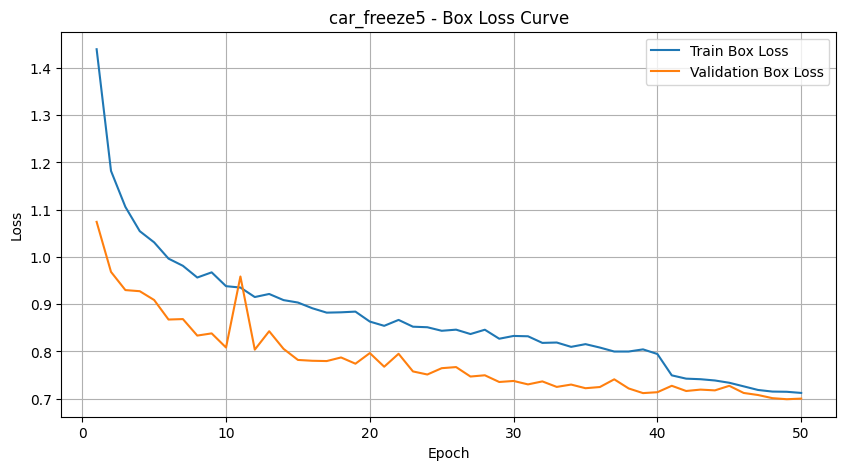

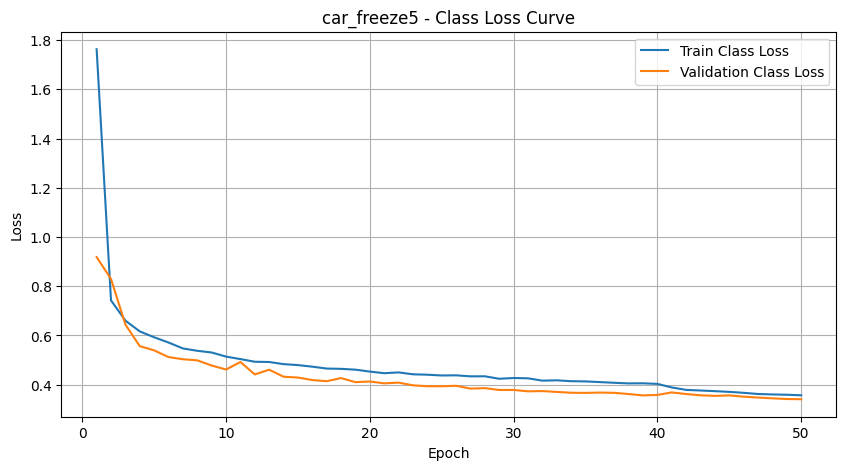

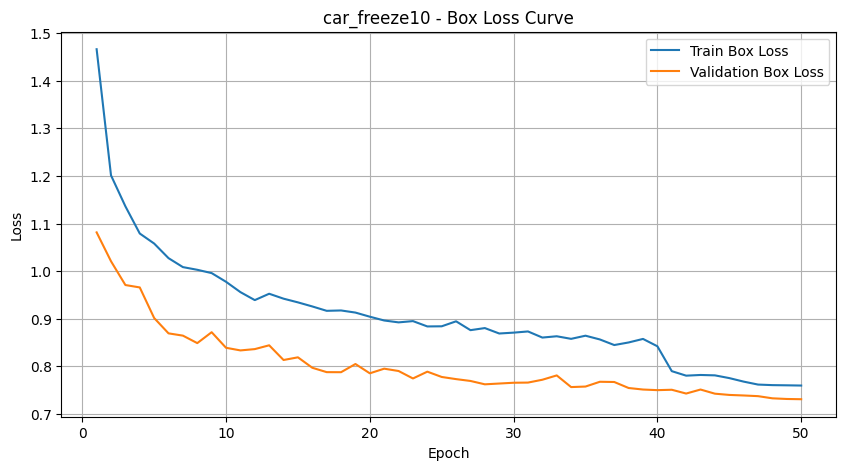

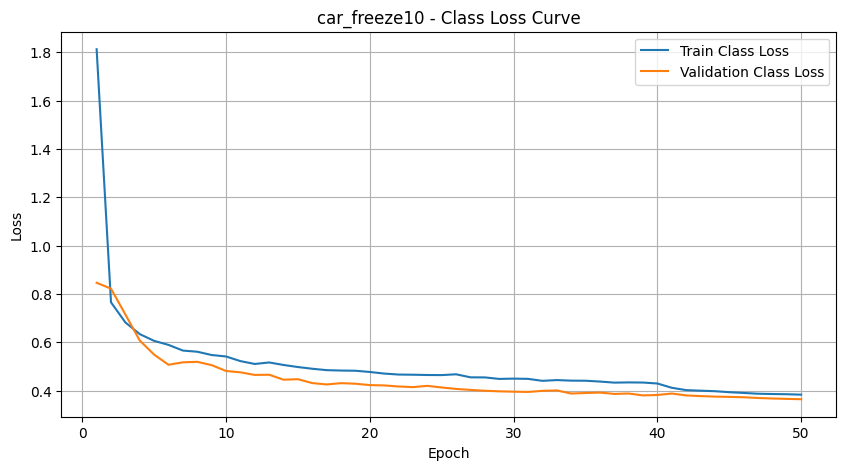

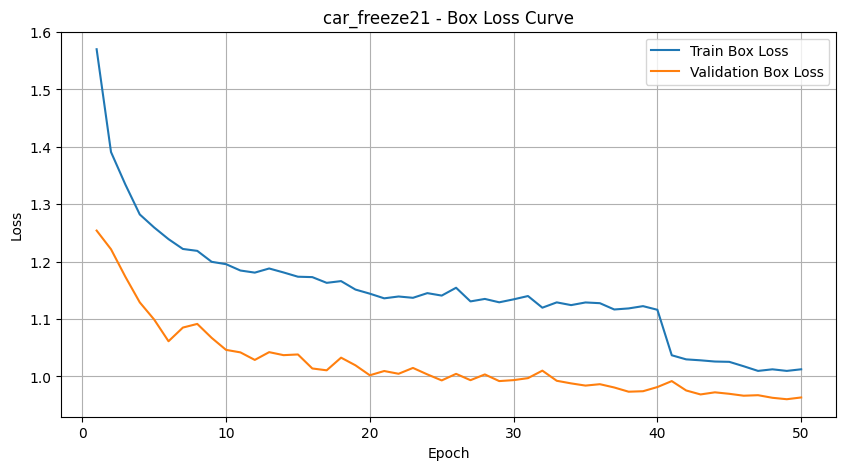

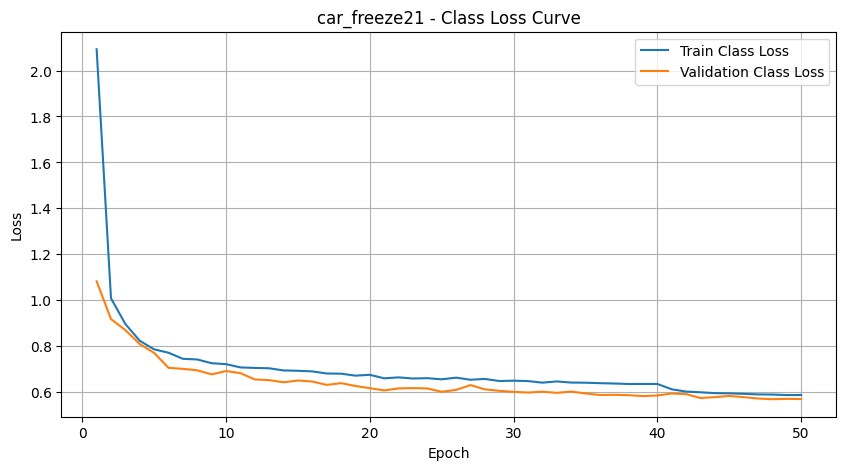

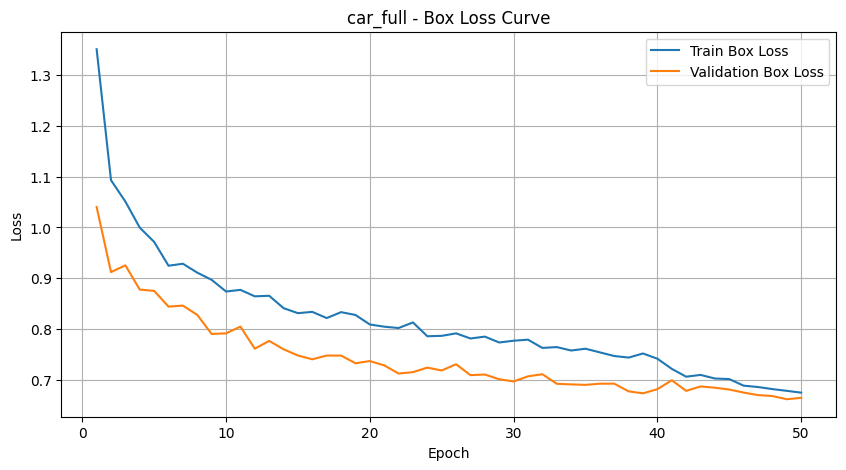

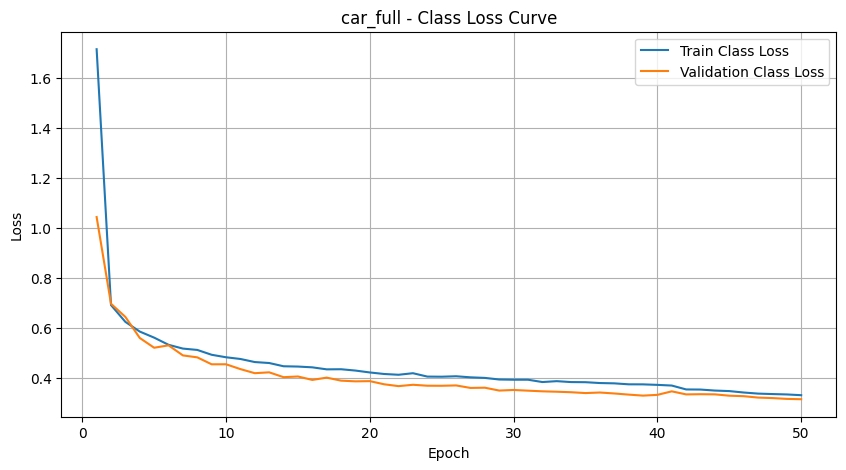

In [8]:
%matplotlib inline
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_loss_curves(model_names):
    for model in model_names:
        csv_path = f"runs/detect/{model}/results.csv"
        if not os.path.exists(csv_path):
            continue
        df = pd.read_csv(csv_path)
        plt.figure(figsize=(10, 5))
        plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
        plt.plot(df["epoch"], df["val/box_loss"], label="Validation Box Loss")
        plt.title(f"{model} - Box Loss Curve")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.show()

        plt.figure(figsize=(10, 5))
        plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss")
        plt.plot(df["epoch"], df["val/cls_loss"], label="Validation Class Loss")
        plt.title(f"{model} - Class Loss Curve")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.show()

for model in ["car_freeze5", "car_freeze10", "car_freeze21", "car_full"]:
    plot_loss_curves([model])


## Detection Metrics Comparison

To evaluate how well each trained model detects cars, we used four key object detection metrics:
- **Precision**: The proportion of predicted boxes that are correct.
- **Recall**: The proportion of ground-truth boxes that are correctly detected.
- **mAP@0.50**: Mean Average Precision at IoU threshold 0.50.
- **mAP@0.50:0.95**: Mean Average Precision averaged over multiple IoU thresholds (more strict).

The metrics were extracted from the final row of each model's `results.csv` file.

| Model         | Precision | Recall | mAP50 | mAP50-95 |
|---------------|-----------|--------|--------|-----------|
| car_freeze5   | 0.991     | 0.985  | 0.994  | 0.833     |
| car_freeze10  | 0.992     | 0.983  | 0.994  | 0.819     |
| car_freeze21  | 0.974     | 0.947  | 0.983  | 0.729     |
| car_full      | 0.994     | 0.987  | 0.994  | 0.844     |

We visualized the metrics using:
- **Grouped barplot** for per-metric model comparison
- **Heatmap** for overall visual summary

> **Observation:**  
The `car_full` model (no frozen layers) achieved the best results in all metrics, especially in `mAP50-95`.  
The `car_freeze21` model performed the worst, as expected due to excessive freezing and lack of trainable layers.

These results confirm that freezing fewer layers typically results in better generalization and detection accuracy, especially when more training data and epochs are available.


          Model  Precision  Recall  mAP50  mAP50-95
0   car_freeze5      0.991   0.985  0.994     0.833
1  car_freeze10      0.992   0.983  0.994     0.819
2  car_freeze21      0.974   0.947  0.983     0.729
3      car_full      0.994   0.987  0.994     0.844


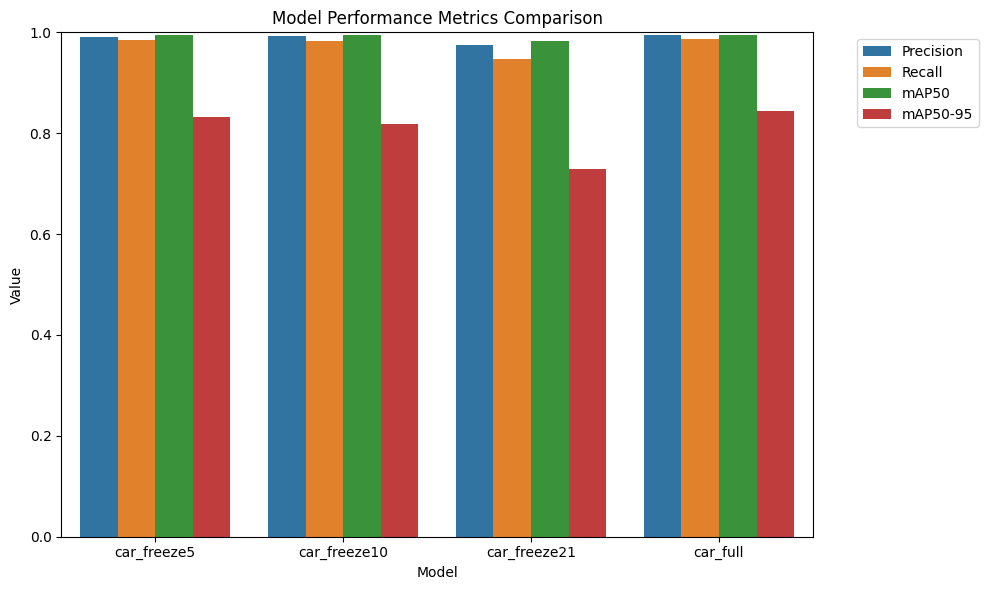

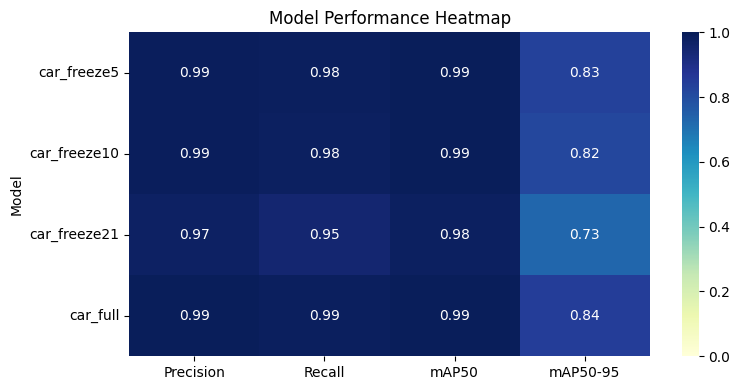

In [ ]:
%matplotlib inline
import pandas as pd
import seaborn as sns

models = ["car_freeze5", "car_freeze10", "car_freeze21", "car_full"]
metrics_table = []

for model_name in models:
    csv_path = f"runs/detect/{model_name}/results.csv"
    df = pd.read_csv(csv_path)
    last = df.iloc[-1]
    metrics_table.append({
        "Model": model_name,
        "Precision": round(last["metrics/precision(B)"], 3),
        "Recall": round(last["metrics/recall(B)"], 3),
        "mAP50": round(last["metrics/mAP50(B)"], 3),
        "mAP50-95": round(last["metrics/mAP50-95(B)"], 3)
    })

df_metrics = pd.DataFrame(metrics_table)
print(df_metrics)

# Melt the metrics dataframe for seaborn barplot
df_melted = pd.melt(df_metrics, id_vars=["Model"], var_name="Metric", value_name="Value")

plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Model", y="Value", hue="Metric")
plt.title("Model Performance Metrics Comparison")
plt.ylim(0, 1)  
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Heatmap
plt.figure(figsize=(8, 4))
sns.heatmap(df_metrics.set_index("Model"), annot=True, cmap="YlGnBu", vmin=0, vmax=1)
plt.title("Model Performance Heatmap")
plt.tight_layout()
plt.show()

## Hyperparameter Experiments

In addition to freezing different layers, we explored how changing training hyperparameters affects model performance. We trained YOLOv8n with three different optimizer and learning rate configurations:

| Experiment Name     | Optimizer | Learning Rate | Batch Size | Epochs |
|---------------------|-----------|---------------|------------|--------|
| `exp_adam_lr1e-2`   | Adam      | 0.01          | 16         | 20     |
| `exp_sgd_lr1e-2`    | SGD       | 0.01          | 16         | 20     |
| `exp_adamw_lr1e-3`  | AdamW     | 0.001         | 16         | 20     |

The training results were evaluated using:
- **Loss curves** (box loss & class loss)
- **Final precision, recall, and mAP metrics**
- **Bounding box visualizations**

### Observations:
- **AdamW** provided the most stable loss reduction and strong generalization.
- **Adam** with a higher learning rate (0.01) showed faster convergence but a bit more fluctuation in validation loss.
- **SGD** converged slower, but maintained good final mAP scores with proper tuning.

> These experiments demonstrate the importance of selecting the right optimizer and learning rate, especially in lightweight models like YOLOv8n.

---


In [1]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=20,
    imgsz=640,
    batch=16,
    optimizer="Adam",
    lr0=0.01,
    name="exp_adam_lr1e-2",
    project="runs/exp_hp"
)

New https://pypi.org/project/ultralytics/8.3.141 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_adam_lr1e-22, nbs=64, nms=False, opset=No

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.1 ms, read: 768.7104.5 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\exp_hp\exp_adam_lr1e-22\labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\exp_hp\exp_adam_lr1e-22
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.16G      1.334      1.203     0.9857       1118        640: 100%|██████████| 63/63 [00:10<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906      0.854      0.817      0.894      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.87G      1.134     0.6789     0.9299        787        640: 100%|██████████| 63/63 [00:08<00:00,  7.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.67it/s]

                   all        200      11906      0.963      0.925      0.971      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.74G      1.104     0.6214     0.9198        870        640: 100%|██████████| 63/63 [00:08<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]

                   all        200      11906      0.924      0.939      0.964      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      5.11G      1.023     0.5674     0.9034        669        640: 100%|██████████| 63/63 [00:08<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.42it/s]

                   all        200      11906      0.978       0.96      0.989      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.61G     0.9859     0.5346     0.8885        908        640: 100%|██████████| 63/63 [00:08<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.65it/s]

                   all        200      11906      0.987      0.967      0.992      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       8.1G     0.9837     0.5297     0.8912        585        640: 100%|██████████| 63/63 [00:09<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.61it/s]

                   all        200      11906      0.984      0.965       0.99      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.64G     0.9627     0.5097     0.8824        922        640: 100%|██████████| 63/63 [00:08<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.56it/s]

                   all        200      11906      0.988      0.969      0.992      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.44G     0.9313     0.4947     0.8774        766        640: 100%|██████████| 63/63 [00:08<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]

                   all        200      11906      0.986      0.967       0.99      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.84G     0.9146      0.483     0.8741        900        640: 100%|██████████| 63/63 [00:08<00:00,  7.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.51it/s]

                   all        200      11906      0.988      0.974      0.993      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.19G     0.8845     0.4656     0.8673       1024        640: 100%|██████████| 63/63 [00:08<00:00,  7.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.06it/s]

                   all        200      11906      0.987      0.971      0.993      0.802


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.09G     0.8796     0.4846     0.8827        586        640: 100%|██████████| 63/63 [00:07<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.09it/s]

                   all        200      11906      0.986      0.969      0.991      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      4.21G     0.8581     0.4479     0.8742        598        640: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.13it/s]

                   all        200      11906      0.983      0.965       0.99      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.01G     0.8525     0.4419     0.8731        438        640: 100%|██████████| 63/63 [00:07<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.01it/s]

                   all        200      11906       0.99      0.972      0.993      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20       3.4G     0.8381     0.4331      0.867        325        640: 100%|██████████| 63/63 [00:07<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.43it/s]

                   all        200      11906      0.987      0.978      0.993      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       3.4G     0.8235     0.4163     0.8646        388        640: 100%|██████████| 63/63 [00:07<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.11it/s]

                   all        200      11906       0.99      0.978      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       3.4G     0.8112     0.4088      0.859        546        640: 100%|██████████| 63/63 [00:07<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.24it/s]

                   all        200      11906      0.991       0.98      0.994      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20       3.4G     0.7837      0.392     0.8561        400        640: 100%|██████████| 63/63 [00:07<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.20it/s]

                   all        200      11906      0.991      0.981      0.994      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       3.4G       0.78     0.3866     0.8533        406        640: 100%|██████████| 63/63 [00:07<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.12it/s]

                   all        200      11906      0.991      0.979      0.994      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20       3.4G     0.7692     0.3801     0.8514        390        640: 100%|██████████| 63/63 [00:07<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.40it/s]

                   all        200      11906      0.991      0.982      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20       3.4G      0.755     0.3719     0.8487        329        640: 100%|██████████| 63/63 [00:06<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.03it/s]

                   all        200      11906      0.992       0.98      0.994      0.826



20 epochs completed in 0.055 hours.
Optimizer stripped from runs\exp_hp\exp_adam_lr1e-22\weights\last.pt, 6.2MB
Optimizer stripped from runs\exp_hp\exp_adam_lr1e-22\weights\best.pt, 6.2MB

Validating runs\exp_hp\exp_adam_lr1e-22\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.08it/s]


                   all        200      11906      0.992       0.98      0.994      0.826
Speed: 0.3ms preprocess, 1.0ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs\exp_hp\exp_adam_lr1e-22


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000013A350AFE20>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [ ]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=25,
    imgsz=640,
    batch=16,
    optimizer="SGD",
    lr0=0.01,
    name="exp_sgd_lr1e-2",
    project="runs/exp_hp"
)

New https://pypi.org/project/ultralytics/8.3.142 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_sgd_lr1e-210, nbs=64, nms=False, opset=No

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.20.1 ms, read: 615.2119.8 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\exp_hp\exp_sgd_lr1e-210\labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\exp_hp\exp_sgd_lr1e-210
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.14G      1.344      1.612      1.033       1118        640: 100%|██████████| 63/63 [00:12<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.49it/s]

                   all        200      11906       0.97      0.885      0.963      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.86G      1.194     0.7511     0.9531        787        640: 100%|██████████| 63/63 [00:08<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.26it/s]

                   all        200      11906      0.974      0.935      0.976      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.73G      1.237     0.7352     0.9556        870        640: 100%|██████████| 63/63 [00:08<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]

                   all        200      11906       0.98      0.948      0.981      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20       5.1G      1.224     0.7062     0.9524        669        640: 100%|██████████| 63/63 [00:08<00:00,  7.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.46it/s]

                   all        200      11906      0.981      0.946      0.981      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.59G      1.145     0.6687     0.9262        908        640: 100%|██████████| 63/63 [00:08<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.44it/s]

                   all        200      11906      0.989      0.957      0.986      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      8.08G      1.072     0.6197      0.914        585        640: 100%|██████████| 63/63 [00:10<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]

                   all        200      11906      0.989      0.962       0.99      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.62G      1.034     0.5915     0.9016        922        640: 100%|██████████| 63/63 [00:08<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]

                   all        200      11906      0.989      0.965       0.99      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.42G     0.9961     0.5798     0.8936        766        640: 100%|██████████| 63/63 [00:08<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.86it/s]

                   all        200      11906      0.989      0.967      0.991       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.82G     0.9799     0.5495     0.8893        900        640: 100%|██████████| 63/63 [00:08<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.75it/s]

                   all        200      11906      0.991      0.972      0.992      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.17G     0.9527     0.5343     0.8828       1024        640: 100%|██████████| 63/63 [00:09<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.87it/s]

                   all        200      11906      0.991      0.972      0.993      0.783


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.07G     0.8937     0.5547     0.8863        586        640: 100%|██████████| 63/63 [00:08<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200      11906      0.988      0.966      0.991      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20       4.2G     0.8689     0.5063     0.8778        598        640: 100%|██████████| 63/63 [00:07<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.91it/s]

                   all        200      11906      0.988      0.972      0.993      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.99G      0.841     0.4884     0.8714        438        640: 100%|██████████| 63/63 [00:07<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        200      11906      0.989      0.973      0.993       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.38G     0.8228      0.475     0.8652        325        640: 100%|██████████| 63/63 [00:07<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.77it/s]

                   all        200      11906      0.991      0.975      0.993      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.38G     0.8099     0.4639     0.8638        388        640: 100%|██████████| 63/63 [00:07<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.993      0.972      0.993        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.38G     0.7985     0.4545     0.8589        546        640: 100%|██████████| 63/63 [00:07<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.94it/s]

                   all        200      11906      0.993      0.975      0.993      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.38G     0.7829      0.439     0.8583        400        640: 100%|██████████| 63/63 [00:07<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.18it/s]

                   all        200      11906      0.992      0.978      0.993      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.38G     0.7806     0.4351     0.8558        406        640: 100%|██████████| 63/63 [00:07<00:00,  8.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.26it/s]

                   all        200      11906      0.992      0.976      0.993      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.38G     0.7732     0.4285     0.8545        390        640: 100%|██████████| 63/63 [00:07<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.13it/s]

                   all        200      11906      0.992      0.977      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.38G     0.7609     0.4242     0.8526        329        640: 100%|██████████| 63/63 [00:07<00:00,  8.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.39it/s]

                   all        200      11906      0.991      0.979      0.994      0.812



20 epochs completed in 0.061 hours.
Optimizer stripped from runs\exp_hp\exp_sgd_lr1e-210\weights\last.pt, 6.2MB
Optimizer stripped from runs\exp_hp\exp_sgd_lr1e-210\weights\best.pt, 6.2MB

Validating runs\exp_hp\exp_sgd_lr1e-210\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


                   all        200      11906      0.991      0.979      0.994      0.812
Speed: 0.4ms preprocess, 1.4ms inference, 0.0ms loss, 6.2ms postprocess per image
Results saved to runs\exp_hp\exp_sgd_lr1e-210


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002CD601C53C0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [ ]:
from ultralytics import YOLO
import torch

torch.cuda.empty_cache()

model = YOLO("yolov8n.pt")
model.train(
    data="dataset.yaml",
    epochs=20,
    imgsz=640,
    batch=16,
    optimizer="AdamW",
    lr0=0.001,
    name="exp_adamw_lr1e-3",
    project="runs/exp_hp"
)

New https://pypi.org/project/ultralytics/8.3.142 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_adamw_lr1e-3, nbs=64, nms=False, opset=N

train: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\train.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.10.0 ms, read: 492.7102.7 MB/s, size: 1312.4 KB)


val: Scanning C:\Users\Ali Buğra Sarıkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\labels\val.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


Plotting labels to runs\exp_hp\exp_adamw_lr1e-3\labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\exp_hp\exp_adamw_lr1e-3
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.16G      1.322      1.423     0.9767       1118        640: 100%|██████████| 63/63 [00:12<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.51it/s]

                   all        200      11906      0.937      0.876      0.949      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.87G      1.075     0.7027     0.9053        787        640: 100%|██████████| 63/63 [00:08<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.89it/s]

                   all        200      11906      0.972      0.937      0.978      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.74G      1.025     0.6348     0.8883        870        640: 100%|██████████| 63/63 [00:08<00:00,  7.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.74it/s]

                   all        200      11906      0.977      0.952      0.986      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      5.11G     0.9687     0.5895     0.8788        669        640: 100%|██████████| 63/63 [00:08<00:00,  7.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]

                   all        200      11906      0.989      0.961      0.989      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.61G     0.9408     0.5607     0.8675        908        640: 100%|██████████| 63/63 [00:08<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        200      11906       0.99      0.964       0.99      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       8.1G     0.9169     0.5379     0.8665        585        640: 100%|██████████| 63/63 [00:10<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.05it/s]

                   all        200      11906      0.991      0.966      0.991      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.64G      0.899     0.5141     0.8601        922        640: 100%|██████████| 63/63 [00:09<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.72it/s]

                   all        200      11906      0.989      0.975      0.993      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.44G     0.8939     0.5104     0.8585        766        640: 100%|██████████| 63/63 [00:09<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.39it/s]

                   all        200      11906      0.988      0.975      0.992      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.84G     0.8764      0.493     0.8569        900        640: 100%|██████████| 63/63 [00:09<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.09it/s]

                   all        200      11906       0.99      0.977      0.992      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.18G     0.8576     0.4796     0.8527       1024        640: 100%|██████████| 63/63 [00:09<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.36it/s]

                   all        200      11906      0.989      0.976      0.993      0.795


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.09G     0.8463     0.5337     0.8556        586        640: 100%|██████████| 63/63 [00:08<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        200      11906      0.991      0.973      0.992      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      4.21G     0.8225     0.4759     0.8508        598        640: 100%|██████████| 63/63 [00:07<00:00,  8.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.13it/s]

                   all        200      11906      0.991      0.975      0.993      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.01G     0.8019     0.4582     0.8463        438        640: 100%|██████████| 63/63 [00:07<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.15it/s]

                   all        200      11906      0.991      0.978      0.993      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20       3.4G     0.7913     0.4446     0.8428        325        640: 100%|██████████| 63/63 [00:07<00:00,  8.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.88it/s]

                   all        200      11906       0.99      0.979      0.993      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       3.4G     0.7868     0.4374     0.8429        388        640: 100%|██████████| 63/63 [00:07<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.74it/s]

                   all        200      11906      0.992      0.977      0.993      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       3.4G     0.7809       0.43     0.8398        546        640: 100%|██████████| 63/63 [00:07<00:00,  8.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.11it/s]

                   all        200      11906      0.992      0.981      0.994      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20       3.4G     0.7635     0.4186     0.8392        400        640: 100%|██████████| 63/63 [00:07<00:00,  8.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.35it/s]

                   all        200      11906      0.993      0.979      0.994      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       3.4G     0.7694     0.4185     0.8381        406        640: 100%|██████████| 63/63 [00:07<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.31it/s]

                   all        200      11906      0.993      0.979      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20       3.4G      0.762     0.4136     0.8372        390        640: 100%|██████████| 63/63 [00:07<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.46it/s]

                   all        200      11906      0.993       0.98      0.994      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20       3.4G     0.7518     0.4109     0.8364        329        640: 100%|██████████| 63/63 [00:07<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.52it/s]

                   all        200      11906      0.994      0.979      0.994      0.817



20 epochs completed in 0.061 hours.
Optimizer stripped from runs\exp_hp\exp_adamw_lr1e-3\weights\last.pt, 6.2MB
Optimizer stripped from runs\exp_hp\exp_adamw_lr1e-3\weights\best.pt, 6.2MB

Validating runs\exp_hp\exp_adamw_lr1e-3\weights\best.pt...
Ultralytics 8.3.133  Python-3.10.0 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.52it/s]


                   all        200      11906      0.994      0.979      0.994      0.817
Speed: 0.4ms preprocess, 1.4ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to runs\exp_hp\exp_adamw_lr1e-3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001FBCCB97430>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

## Hyperparameter Training Results and Visualizations

In this section, we visualize the training behavior and prediction quality of models trained with different optimizers and learning rates.

### Loss Curves

The plots below show the training and validation **box loss** and **class loss** over epochs for each experiment:

- 🔹 `exp_adam_lr1e-2` (Adam, lr=0.01)
- 🔹 `exp_adamw_lr1e-3` (AdamW, lr=0.001)
- 🔹 `exp_sgd_lr1e-2` (SGD, lr=0.01)

These curves help assess:
- Whether the model is converging
- Training stability across optimizers
- Generalization (gap between train and validation losses)

### Bounding Box Predictions

Each model was also tested on a sample test image (`20160331_NTU_00017.png`). The predicted bounding boxes were visualized to compare detection performance qualitatively.

### Final Metric Snapshot

| Model              | Optimizer | Learning Rate | Precision | mAP50-95 |
|--------------------|-----------|----------------|-----------|-----------|
| `exp_adam_lr1e-2`  | Adam      | 0.01           | 0.992     | 0.826     |
| `exp_adamw_lr1e-3` | AdamW     | 0.001          | 0.994     | 0.817     |
| `exp_sgd_lr1e-2`   | SGD       | 0.01           | 0.991     | 0.812     |

> **Observation:**  
Although `AdamW` had slightly better convergence in loss curves, `Adam` with higher learning rate achieved the best `mAP50-95`. All models performed comparably well in terms of precision.

This confirms that while all optimizers can train YOLOv8n effectively, **Adam with appropriate learning rate can offer a good balance between convergence speed and final accuracy.**


exp_adam_lr1e-2 - Precision: 0.992  mAP50-95: 0.826
exp_adamw_lr1e-3 - Precision: 0.994  mAP50-95: 0.817
exp_sgd_lr1e-210 - Precision: 0.991  mAP50-95: 0.812

 exp_adam_lr1e-2 - LOSS CURVES


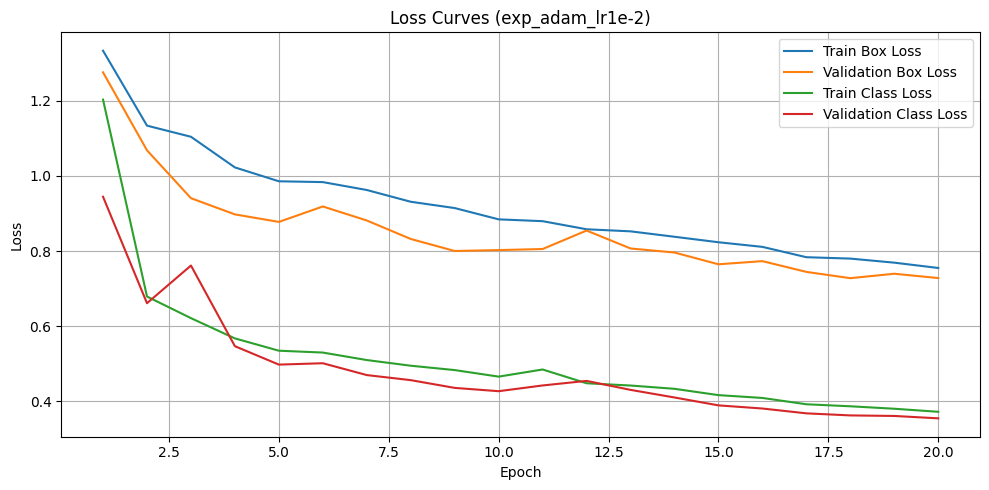


exp_adam_lr1e-2 - BOUNDING BOX PREDICTION

image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 51 cars, 69.1ms
Speed: 1.5ms preprocess, 69.1ms inference, 62.9ms postprocess per image at shape (1, 3, 384, 640)


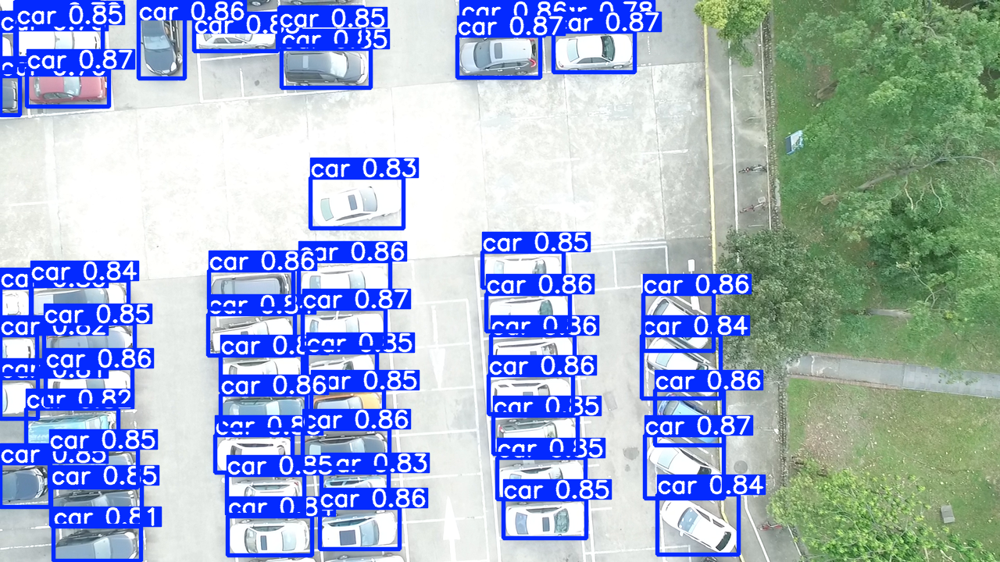


 exp_adamw_lr1e-3 - LOSS CURVES


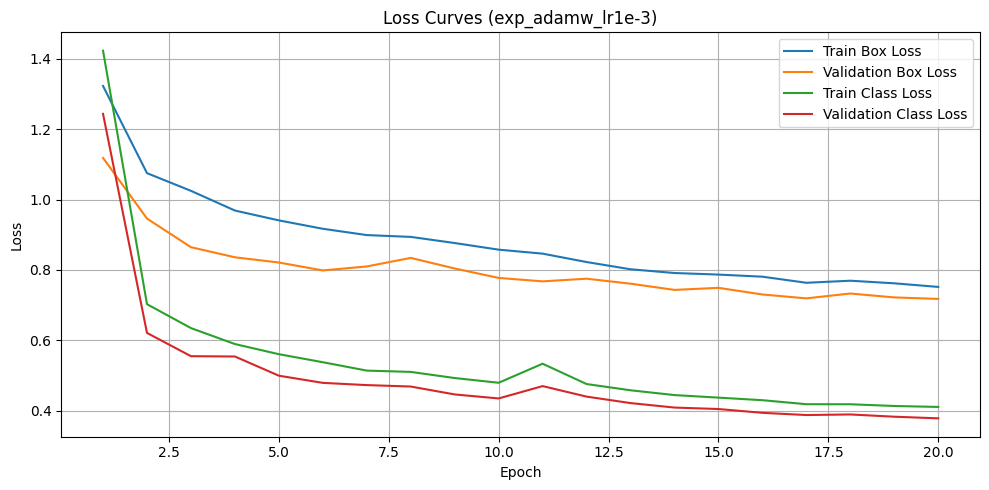


exp_adamw_lr1e-3 - BOUNDING BOX PREDICTION

image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 53 cars, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


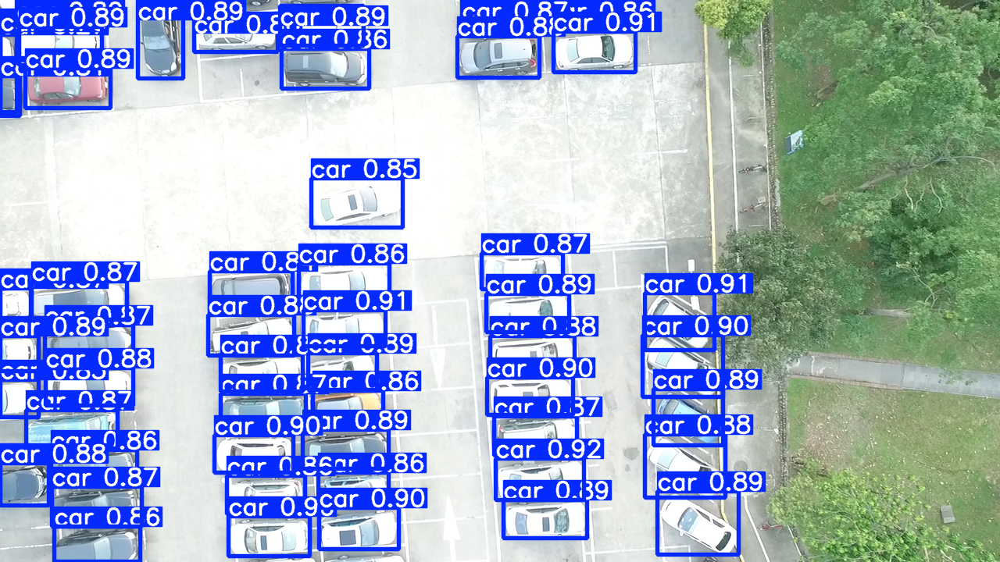


 exp_sgd_lr1e-2 - LOSS CURVES


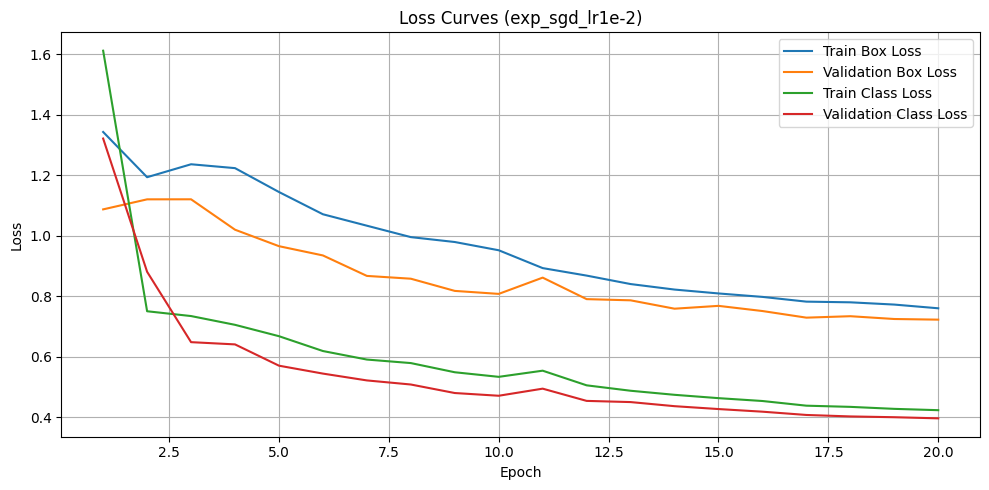


exp_sgd_lr1e-2 - BOUNDING BOX PREDICTION

image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 51 cars, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


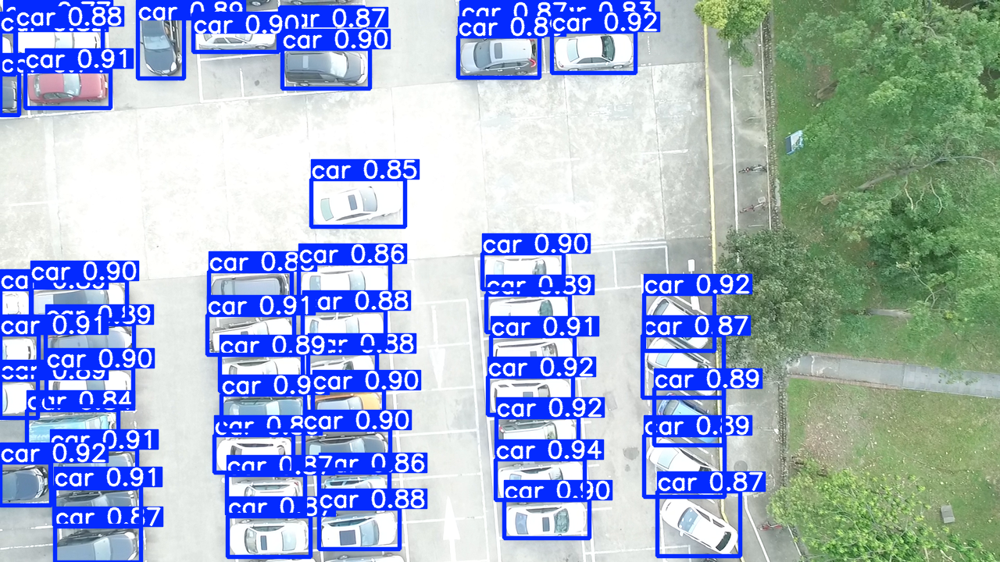

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import display
from PIL import Image

models = {
    "exp_adam_lr1e-2": "runs/exp_hp/exp_adam_lr1e-2",
    "exp_adamw_lr1e-3": "runs/exp_hp/exp_adamw_lr1e-3",
    "exp_sgd_lr1e-2": "runs/exp_hp/exp_sgd_lr1e-210"
}

sample_image = "dataset/images/test/20160331_NTU_00017.png"

for model in ["exp_adam_lr1e-2", "exp_adamw_lr1e-3", "exp_sgd_lr1e-210"]:
    path = f"runs/exp_hp/{model}/results.csv"
    if os.path.exists(path):
        df = pd.read_csv(path)
        print(f"{model} - Precision: {df.iloc[-1]['metrics/precision(B)']:.3f}  mAP50-95: {df.iloc[-1]['metrics/mAP50-95(B)']:.3f}")


for model_name, model_path in models.items():
    print(f"\n {model_name} - LOSS CURVES")

    csv_path = os.path.join(model_path, "results.csv")
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)
        plt.figure(figsize=(10, 5))
        plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
        plt.plot(df["epoch"], df["val/box_loss"], label="Validation Box Loss")
        plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss")
        plt.plot(df["epoch"], df["val/cls_loss"], label="Validation Class Loss")
        plt.title(f"Loss Curves ({model_name})")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print(f"CSV not found at {csv_path}")

    print(f"\n{model_name} - BOUNDING BOX PREDICTION")
    weights_path = os.path.join(model_path, "weights", "best.pt")
    if os.path.exists(weights_path) and os.path.exists(sample_image):
        model = YOLO(weights_path)
        results = model.predict(source=sample_image, conf=0.25, save=False, show=False)
        result_image = results[0].plot()
        display(Image.fromarray(result_image[..., ::-1]))  # Convert BGR to RGB
    else:
        print(f"Model or image file not found:\n- {weights_path}\n- {sample_image}")

## Counting Accuracy and MSE Evaluation

To evaluate the counting performance of each trained model, we compared the number of cars predicted by the model with the ground-truth annotations for each image in the test set.

We computed two metrics:

- **Exact Match Accuracy**: The percentage of test images where the predicted car count exactly matches the ground-truth count.

- **Mean Squared Error (MSE)**: The average squared difference between predicted and true car counts.

 

###  Summary Table:

| Model         | Exact Match Accuracy (%) | MSE   |
|---------------|--------------------------|-------|
| car_freeze5   | 43.0                     | 2.97  |
| car_freeze10  | 38.0                     | 4.65  |
| car_freeze21  | 7.5                      | 123.04|
| car_full      | 48.5                     | 2.88  |

###  Observations:

- The **`car_full`** model, where all layers were trainable, achieved the highest **exact match accuracy (48.5%)** and lowest **MSE (2.88)**.
- As more layers were frozen, performance generally declined — most notably with `car_freeze21`, which had **very high error (MSE = 123.04)** and only **7.5% exact match**.
- These results confirm that **freezing too many layers limits the model’s capacity to learn accurate spatial features for object counting**.

> Additionally, a full comparison table (`comparison_df`) was created to view the prediction and ground-truth count per test image.

## Performance Improvement Suggestions

Based on the results and observations from the evaluation, the following steps can be taken to improve model performance in both detection and counting accuracy:

### 1. Use a Larger YOLO Model (YOLOv8s or YOLOv8m)
- The current model is YOLOv8n (nano), which is designed for speed but limited in capacity.
- Using a larger backbone (e.g. YOLOv8s) can help capture more complex features, especially in crowded scenes.

### 2. Data Augmentation
- Apply additional augmentations during training such as:
  - `hsv_h`, `hsv_s`, `hsv_v` (color jittering),
  - `scale`, `translate`, `perspective`,
  - `mosaic`, `mixup` (YOLO-specific).
- This would increase model robustness to variations in lighting, perspective, and object density.

### 3. Use Weighted Box Fusion (WBF) in Post-processing
- Improve bounding box selection by using ensemble-based box fusion rather than standard NMS (non-maximum suppression).
- This helps in overlapping car scenarios where NMS may suppress valid detections.

### 4. Hyperparameter Tuning with Validation Feedback
- Use learning rate schedulers (e.g., Cosine Annealing, ReduceLROnPlateau).
- Perform grid search or use tools like Optuna to tune learning rate, weight decay, confidence thresholds more precisely.

### 5. Fine-tune on a Custom Dataset
- Collect and label 200–500 more images from similar drone views to reduce domain shift.
- Fine-tuning on domain-specific samples improves generalization to new parking lot layouts or lighting.

### 6. Try Alternative Architectures
- Explore detection + counting hybrids (e.g., YOLO + regression head).
- Try density map-based models like **CSRNet**, especially for overlapping cars.
- Consider **instance segmentation** (Mask R-CNN) for pixel-level car separation.

---


In [ ]:
from ultralytics import YOLO
import numpy as np
import pandas as pd
import glob

freeze_configs = {
    "car_freeze5": 5,
    "car_freeze10": 10,
    "car_freeze21": 21,
    "car_full": 0
}

test_images = glob.glob("dataset/images/test/*.png")
test_labels = glob.glob("dataset/labels/test/*.txt")
car_class_id = 0
results_summary = []

for model_name in freeze_configs.keys():
    model = YOLO(f"runs/detect/{model_name}/weights/best.pt")
    pred_counts = []
    true_counts = []

    for img_path in test_images:
        results = model.predict(source=img_path, conf=0.25, verbose=False)
        preds = results[0].boxes
        num_pred = sum(int(cls) == car_class_id for cls in preds.cls.cpu().numpy())
        pred_counts.append(num_pred)

    for label_path in test_labels:
        with open(label_path) as f:
            lines = f.readlines()
            num_true = sum(1 for line in lines if int(line.split()[0]) == car_class_id)
            true_counts.append(num_true)

    pred_counts = np.array(pred_counts)
    true_counts = np.array(true_counts)
    exact_match = np.mean(pred_counts == true_counts)
    mse = np.mean((pred_counts - true_counts)**2)

    results_summary.append({
        "Model": model_name,
        "ExactMatchAcc": round(exact_match * 100, 2),
        "MSE": round(mse, 2)
    })
comparison_df = pd.DataFrame({
    "Image": [os.path.basename(p) for p in test_images],
    "Predicted": pred_counts,
    "GroundTruth": true_counts,
    "Match": pred_counts == true_counts
})

summary_df = pd.DataFrame(results_summary)
print("Counting Accuracy and Error:")
print(summary_df)


Counting Accuracy and Error:
          Model  ExactMatchAcc     MSE
0   car_freeze5           43.0    2.97
1  car_freeze10           38.0    4.65
2  car_freeze21            7.5  123.04
3      car_full           48.5    2.88


## Confidence Threshold Sensitivity Analysis

In this experiment, we explored the effect of varying the YOLOv8 `conf` (confidence threshold) parameter on detection performance. This threshold determines the minimum objectness confidence required for a detection to be accepted.

We compared two models:

- **`car_full`** – the best-performing model (no layers frozen)
- **`car_freeze21`** – the worst-performing model (only head is trainable)

We selected a representative test image:  
`20160331_NTU_00017.png`

The detection results were recorded at four different confidence thresholds: **0.2**, **0.4**, **0.6**, and **0.8**.

---

### Car Detection Results by Confidence Threshold:

| Threshold | car_full Predictions | car_freeze21 Predictions |
|-----------|----------------------|---------------------------|
| 0.2       | 54 cars              | 59 cars                    |
| 0.4       | 52 cars              | 53 cars                   |
| 0.6       | 51 cars              | 49 cars                   |
| 0.8       | 48 cars              | 8 cars                   |

> Note: Ground-truth count is **54 cars** for this image.

---

### Observations:

- The `car_full` model is **more robust across thresholds**, maintaining consistent detections with minor drop-off from 54 → 48.
- The `car_freeze21` model is **highly unstable at higher thresholds** (only 8 cars at conf=0.8).
- The **optimal confidence threshold** for accurate counting in both models appears to be **between 0.4 and 0.6**.
- This experiment highlights that undertrained models (e.g., freeze=21) can behave erratically when thresholds are not tuned, while fully trained models are more reliable.

---

### Conclusion:

This ablation confirms that `conf` is a critical YOLOv8 hyperparameter. The best model (car_full) remains stable under varying thresholds, while weaker models (car_freeze21) are more sensitive. Therefore, confidence threshold tuning should be part of the validation pipeline.



image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 59 cars, 17.1ms
Speed: 2.0ms preprocess, 17.1ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


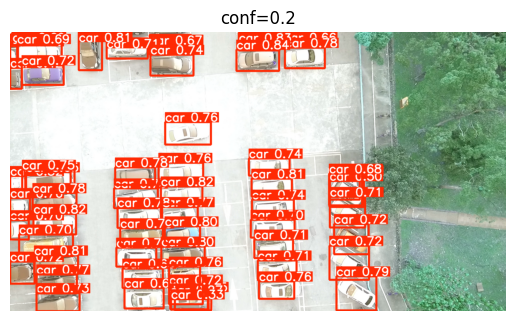


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 53 cars, 15.2ms
Speed: 2.6ms preprocess, 15.2ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


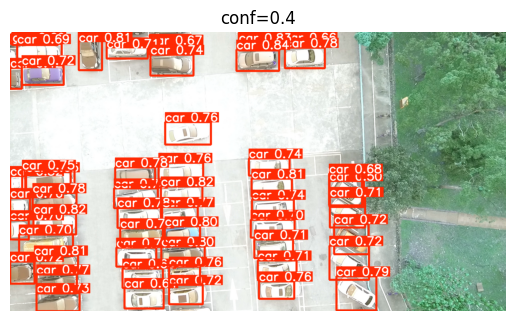


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 49 cars, 15.1ms
Speed: 2.5ms preprocess, 15.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


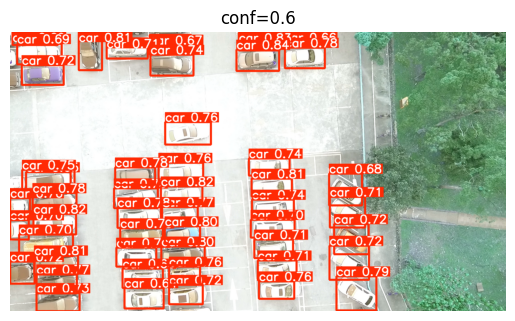


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 8 cars, 15.1ms
Speed: 2.2ms preprocess, 15.1ms inference, 4.2ms postprocess per image at shape (1, 3, 384, 640)


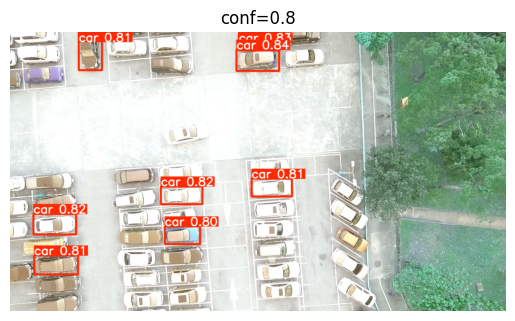

In [6]:
%matplotlib inline
from ultralytics import YOLO
import matplotlib.pyplot as plt

model = YOLO("runs/detect/car_freeze21/weights/best.pt")
img_path = "dataset/images/test/20160331_NTU_00017.png"

for conf_thresh in [0.2, 0.4, 0.6, 0.8]:
    results = model.predict(source=img_path, conf=conf_thresh)
    im_array = results[0].plot()
    plt.imshow(im_array)
    plt.title(f"conf={conf_thresh}")
    plt.axis("off")
    plt.show()


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 54 cars, 17.8ms
Speed: 2.6ms preprocess, 17.8ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)


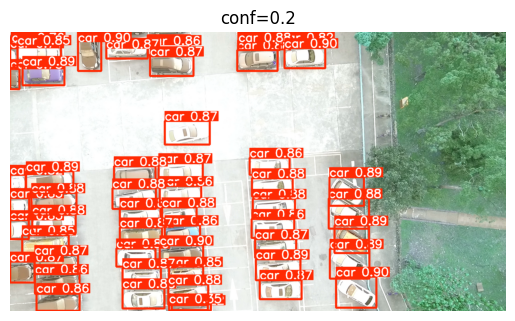


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 52 cars, 16.7ms
Speed: 2.2ms preprocess, 16.7ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


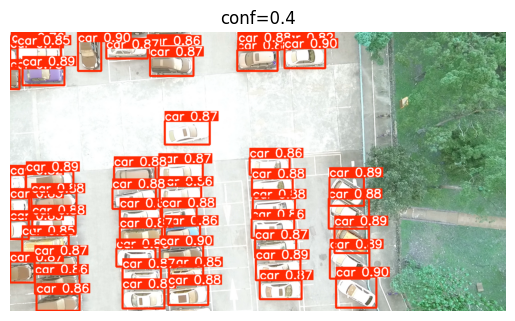


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 51 cars, 14.9ms
Speed: 2.1ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


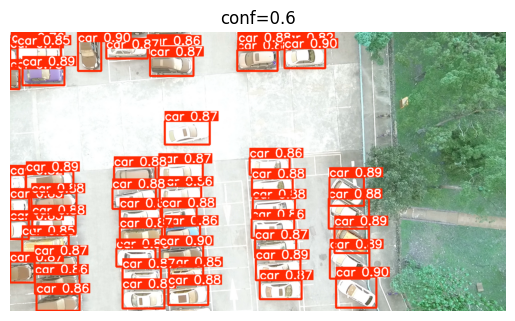


image 1/1 c:\Users\Ali Bura Sarkaya\Desktop\Derslerim\BBM418\Assignment3\dataset\images\test\20160331_NTU_00017.png: 384x640 48 cars, 14.8ms
Speed: 2.2ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


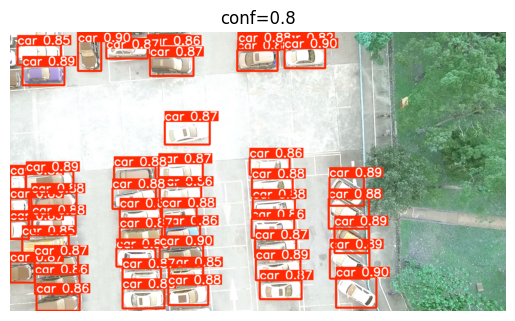

In [5]:
%matplotlib inline
from ultralytics import YOLO
import matplotlib.pyplot as plt

model = YOLO("runs/detect/car_full/weights/best.pt")
img_path = "dataset/images/test/20160331_NTU_00017.png"

for conf_thresh in [0.2, 0.4, 0.6, 0.8]:
    results = model.predict(source=img_path, conf=conf_thresh)
    im_array = results[0].plot()
    plt.imshow(im_array)
    plt.title(f"conf={conf_thresh}")
    plt.axis("off")
    plt.show()

## Final Discussion and Conclusion

In this study, we experimented with training YOLOv8n on drone-based parking lot images for the task of car detection and counting. Various training configurations and hyperparameters were explored, including freezing different layers and changing the optimizer and learning rate.

### Key Observations:

- The **`car_full`** model (no frozen layers) consistently performed the best across all metrics:
  - Highest **Exact Match Accuracy** (48.5%)
  - Lowest **MSE** (2.88)
  - Best **Precision** (0.994) and **mAP50-95** (0.844)
- The **`car_freeze21`** model, which only trained the detection head, performed the worst:
  - Very high MSE (123.04)
  - Only 7.5% Exact Match Accuracy
- Among optimizers, **Adam** with learning rate 0.01 (`exp_adam_lr1e-2`) yielded strong performance in terms of `mAP50-95`, showing fast convergence and good generalization.
- **AdamW** was slightly more stable in loss curves but slightly lower in final mAP.

### Takeaways:

- **Freezing fewer layers leads to better detection and counting**, especially when training data is limited.
- **Careful tuning of optimizers and learning rates can yield significant improvements**, even in lightweight models like YOLOv8n.
- YOLOv8n, despite being the smallest variant, proved highly effective in detecting and counting cars in aerial imagery with high precision.

> Overall, our experiments show that YOLOv8n is a fast and accurate model for real-time vehicle counting in drone imagery, and training it fully gives the best results.


## Alternative Methods for Object Counting

While YOLOv8 provides a robust detection-based approach, several alternative methods exist for object counting, especially in dense or overlapping scenes:

### 1.  Density Map Estimation (e.g., CSRNet, MCNN)
- These models output a density heatmap over the image, where the integral of the map gives the count.
- Often used in crowd counting, they work well even when bounding boxes are difficult due to heavy occlusion.

### 2.  Instance Segmentation (e.g., Mask R-CNN)
- Instead of bounding boxes, each object is segmented pixel-by-pixel.
- Useful in high-resolution drone imagery where overlapping cars can be separated more accurately.

### 3.  Transformer-based Object Detection (e.g., DETR)
- Uses self-attention mechanisms to predict object positions without anchor boxes.
- Still in development for real-time use but promising for structured scenes.

### 4.  Classical Computer Vision Techniques
- Edge detection, contour finding, morphological filtering, and connected component labeling.
- Lightweight but less robust, usually fail in dense and varied lighting conditions.

>  **Recommendation:** For high-density or occluded scenarios, density-based or segmentation models might outperform YOLO-style detectors. However, YOLOv8 remains ideal for real-time, mobile deployment.
